<a href="https://colab.research.google.com/github/yuliagrajewska/Metropolis-Hastings-Sampling-implementation/blob/main/M_H_code.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import numpy as np
from numpy.random import normal
import matplotlib.pyplot as plt

import ipywidgets as widgets
from IPython.display import display
import plotly.express as px
import pandas as pd
from matplotlib.animation import FuncAnimation
from IPython.display import display, clear_output
plt.style.use('ggplot')
import sys

In [2]:
def target_distr(x):
    M = np.array([[5,4],[4,5]])
    return np.exp(-0.5*np.dot(x,np.dot(M,x)))

In [3]:
def rand_prop(x):
    return x+normal(size=len(x), scale = 2)
#random proposition for M-H alg, random walk metropolis formula, variance  = 1

In [4]:
def prop2(x):
    x = x[0]
    return np.random.uniform(x-1,x+1,1)

In [5]:
sample_m = np.array([[5,4],[4,5]])


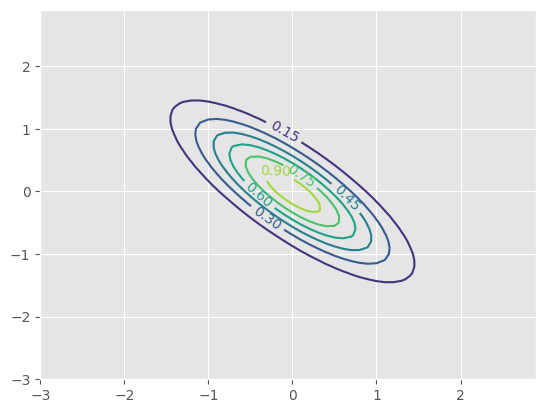

In [6]:
x = np.arange(-3.0, 3.0, 0.1)
y = np.arange(-3.0, 3.0, 0.1)
X, Y = np.meshgrid(x, y)
Z = np.array([[target_distr(np.array([X[i,j],Y[i,j]])) for j in range(len(X[0]))] for i in range(len(X))])
fig1 = plt.figure()
CS = plt.contour(X, Y, Z)
plt.clabel(CS, inline=1, fontsize=10);



In [7]:
def Metropolis_Hastings(N,target,prop,x0=np.zeros(2)):
    x = x0
    traj = [x0]
    ar = 0
    for i in range(1,N):
        y = prop(x)
        #print(y,x)
        ratio = target(y)/target(x)
        #print(ratio)
        a = np.min([1.,ratio])
        r = np.random.rand()
        if r <a:
            x = y
            ar+=1
        traj += [x]
    r = ar/N
    return np.array(traj), r

# 2D normal distribution

In [8]:
n = [100,500,1000,5000,10000, 50000]
tr, ar = [], []
for i in n:
    t,a = Metropolis_Hastings(i,target_distr, rand_prop)
    tr.append(t)
    ar.append(a)
#print(tr[0])

In [9]:
x_data = []
y_data = []
for instance in tr:
    xd = []
    yd = []
    #print('i', instance)
    for i in range(len(instance)):
        xd.append(instance[i][0])
        yd.append(instance[i][1])
    x_data.append(xd)
    y_data.append(yd)



In [10]:
for i in range(len(n)):
    fig = px.scatter(x=x_data[i],y=y_data[i],marginal_x="histogram", marginal_y="histogram", title = '2D Gaussian, Gaussian transition '+str(n[i])+' samples')
    fig.show()

In [11]:
#animated display of the sampling process - doesn't look as nice on colab as it does in Jupyter :(
fig, ax = plt.subplots(figsize = (5,3))
ax.set(xlim=(-3,3),ylim=(-3,3))
colors = np.array(["red","green","blue","yellow","pink","black","orange","purple","cyan","magenta"])
cl = ['blue']

for i in range(2,200):
    cl.insert(0,'cyan')
    #ax.cla()
    ax.scatter(x_data[3][:i],y_data[3][:i],  c = cl[:i])
    ax.set(xlim=(-3,3),ylim=(-3,3))
    ax.set_title("Sampling using MH algorithm, draw #"+str(i))
    display(fig)
    clear_output(wait = True)
    plt.pause(0.05)
    #print(i)

KeyboardInterrupt: 

# funny 1d distribution

In [12]:
def pi2(x):
    x = x[0]
    #print(np.power(np.sin(x),2)*np.power(np.sin(2*x),2)*np.exp(-0.5*x*x))
    return np.power(np.sin(x),2)*np.power(np.sin(3*x),2)*np.exp(-0.5*x*x)

Text(0.5, 1.0, 'shape of the distribution (up to a constant)')

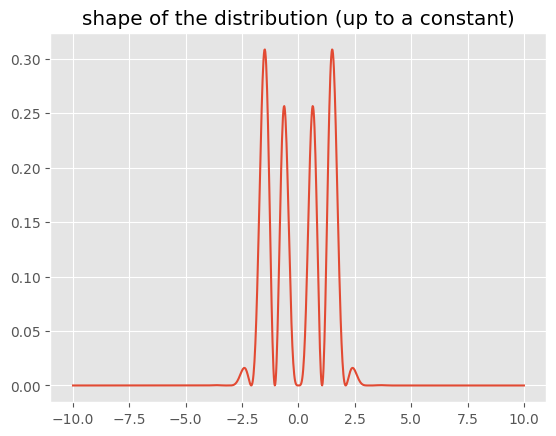

In [13]:
a = np.linspace(-10,10,1000)
y = np.power(np.sin(a),2)*np.power(np.sin(3*a),2)*np.exp(-0.5*a*a)
plt.plot(a,y)
plt.title('shape of the distribution (up to a constant)')

In [14]:
n = [100,500,1000,5000,10000, 50000, 100000]
tr2, ar2 = [], []
for i in n:
    t,a = Metropolis_Hastings(i,pi2, rand_prop, x0 = [0])
    tr2.append(t)
    ar2.append(a)


<ipython-input-7-ea59a31f59d1>:8: RuntimeWarning:

divide by zero encountered in scalar divide



In [15]:
print(ar2)

[0.38, 0.308, 0.354, 0.3506, 0.3404, 0.341, 0.3435]


In [16]:
x_data2 = []
for instance in tr2:
    xd = []
    #print('i', instance)
    for i in range(len(instance)):
        xd.append(instance[i])
    x_data2.append(xd)



In [17]:
for i in range(len(n)):
    fig = px.histogram(x_data2[i], title = 'Gaussian transition '+str(n[i])+' samples')
    fig.show()

In [18]:
n = [100,500,1000,5000,10000, 50000, 100000]
tr3, ar3 = [], []
for i in n:
    t,a = Metropolis_Hastings(i,pi2, prop2, x0 = [0])
    tr3.append(t)
    ar3.append(a)
#print(tr[0])

<ipython-input-7-ea59a31f59d1>:8: RuntimeWarning:

divide by zero encountered in scalar divide



In [19]:
x_data3 = []
for instance in tr3:
    xd = []
    #print('i', instance)
    for i in range(len(instance)):
        xd.append(instance[i])
    x_data3.append(xd)



In [20]:
for i in range(len(n)):
    fig = px.histogram(x_data3[i], title = 'Uniform transition [x-1, x+1],'+str(n[i])+' samples')
    fig.show()

# Bonus: Exponential distribution that didn't make it to the paper

In [21]:
def pi3(x):
    x = x[0]
    if x>=0:
        return np.exp(-x)
    else:
        return 0

In [22]:
t3,b = Metropolis_Hastings(100000,pi3,rand_prop, x0=[3])

(array([1.1140e+04, 1.0315e+04, 9.1650e+03, 8.1420e+03, 6.9910e+03,
        6.7160e+03, 5.3400e+03, 4.6760e+03, 4.5100e+03, 3.7230e+03,
        3.3900e+03, 3.0330e+03, 2.7100e+03, 2.2380e+03, 1.9840e+03,
        1.8680e+03, 1.6520e+03, 1.4420e+03, 1.3520e+03, 1.1160e+03,
        9.3200e+02, 8.9300e+02, 8.0500e+02, 6.2900e+02, 6.0700e+02,
        5.2900e+02, 4.6400e+02, 4.9000e+02, 3.7600e+02, 3.3200e+02,
        2.4400e+02, 2.3200e+02, 2.1800e+02, 1.8600e+02, 1.5900e+02,
        1.4800e+02, 1.6100e+02, 1.0800e+02, 1.2200e+02, 8.0000e+01,
        6.8000e+01, 8.9000e+01, 5.2000e+01, 5.8000e+01, 6.0000e+01,
        3.9000e+01, 3.9000e+01, 4.2000e+01, 2.3000e+01, 3.0000e+01,
        2.7000e+01, 2.1000e+01, 2.6000e+01, 2.2000e+01, 1.7000e+01,
        1.7000e+01, 1.5000e+01, 1.5000e+01, 1.1000e+01, 1.0000e+01,
        1.1000e+01, 1.5000e+01, 8.0000e+00, 1.2000e+01, 8.0000e+00,
        8.0000e+00, 6.0000e+00, 1.0000e+00, 5.0000e+00, 4.0000e+00,
        2.0000e+00, 0.0000e+00, 2.0000e+00, 1.00

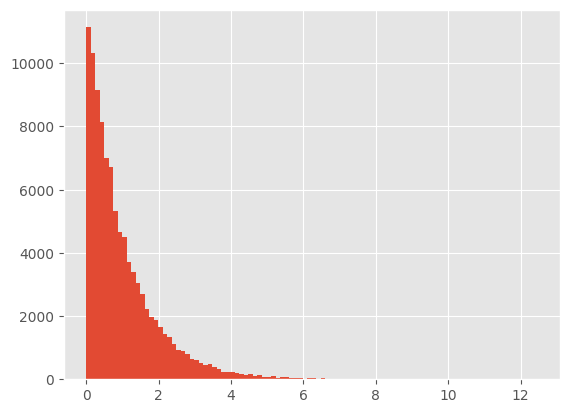

In [23]:
new = []
for t in t3:
    new.append(t[0])
plt.hist(new, bins = 100)

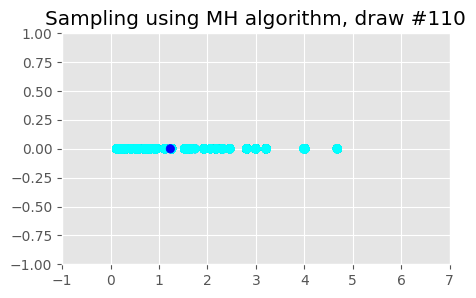

In [ ]:
fig, ax = plt.subplots(figsize = (5,3))
ax.set(xlim=(-1,7),ylim=(-1,1))
colors = np.array(["red","green","blue","yellow","pink","black","orange","purple","cyan","magenta"])
cl = ['blue']

for i in range(2,1000):
    cl.insert(0,'cyan')
    #ax.cla()
    ax.scatter(new[:i],[0] * len(new[:i]),  c = cl[:i])
    ax.set(xlim=(-1,7),ylim=(-1,1))
    ax.set_title("Sampling using MH algorithm, draw #"+str(i))
    display(fig)
    clear_output(wait = True)
    plt.pause(0.05)
    #print(i)